# COMP4702 Assignment - Drosophila (Fruit Fly) Sex Classifier
Jack Barton SNo.46466293

## Data Loading and Pre-processing 

In [15]:
import pandas as pd
from sklearn.impute import SimpleImputer
import seaborn as sns
import numpy as np

The data used was provided by: Hoffmann, Ary A.; Smith, Ailie; Griffin, Philippa C.; Hangartner, Sandra B. (2016). Data from: A collection of Australian Drosophila datasets on climate adaptation and species distributions [Dataset]. Dryad. https://doi.org/10.5061/dryad.k9c31

Load the data into a pandas DataFrame and visualize the data

['Species', 'Population', 'Latitude', 'Longitude', 'Year_start', 'Year_end', 'Temperature', 'Vial', 'Replicate', 'Sex', 'Thorax_length', 'l2', 'l3p', 'l3d', 'lpd', 'l3', 'w1', 'w2', 'w3', 'wing_loading']


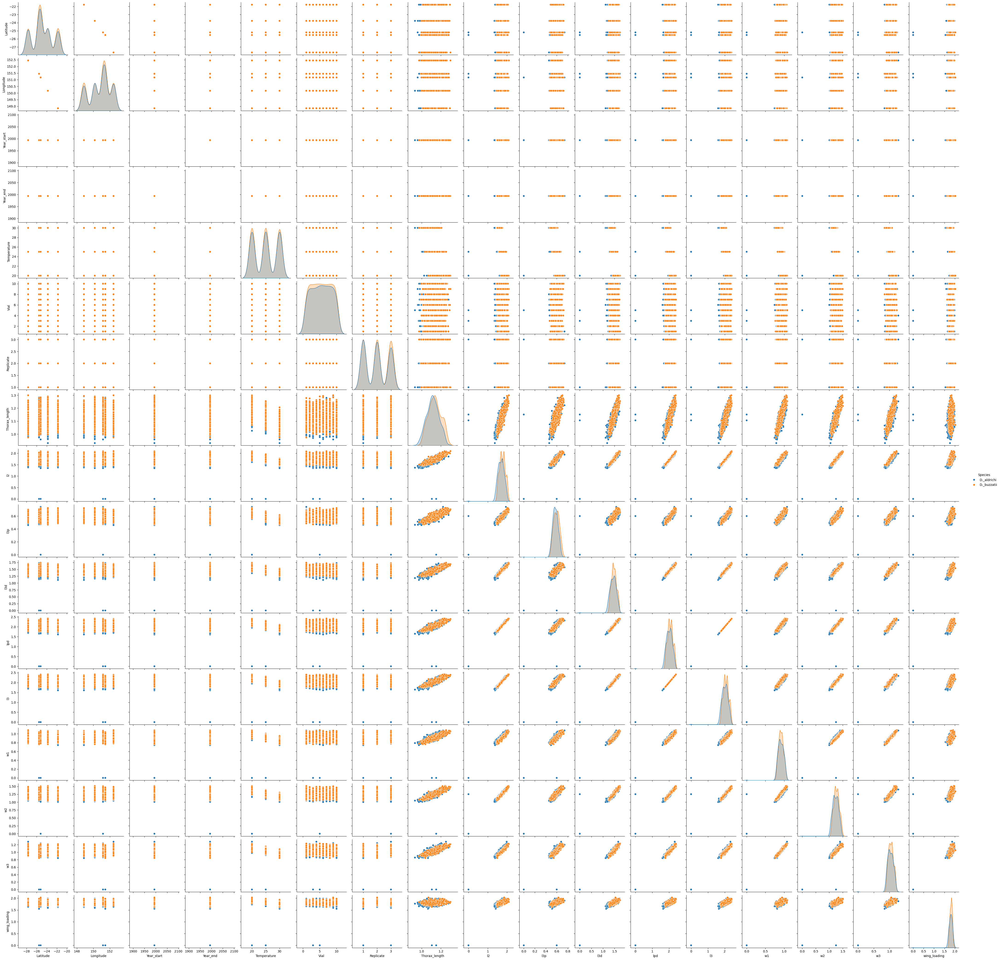

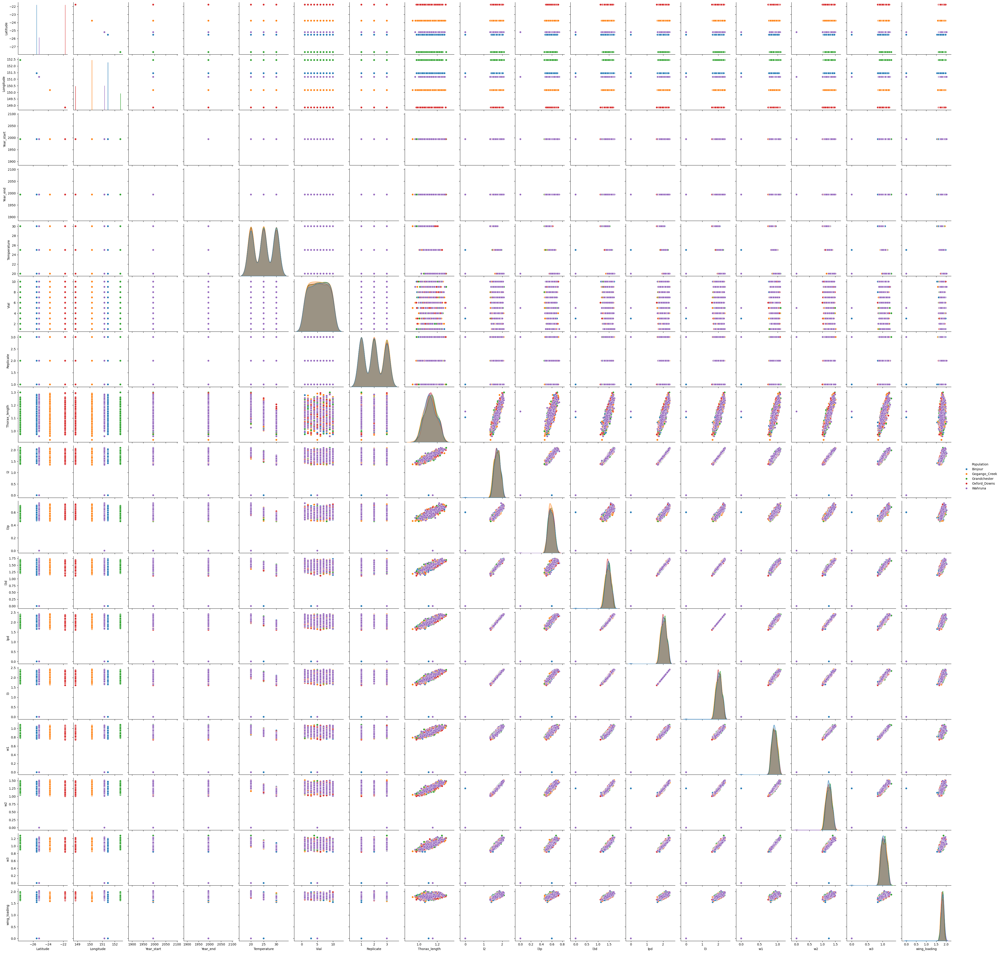

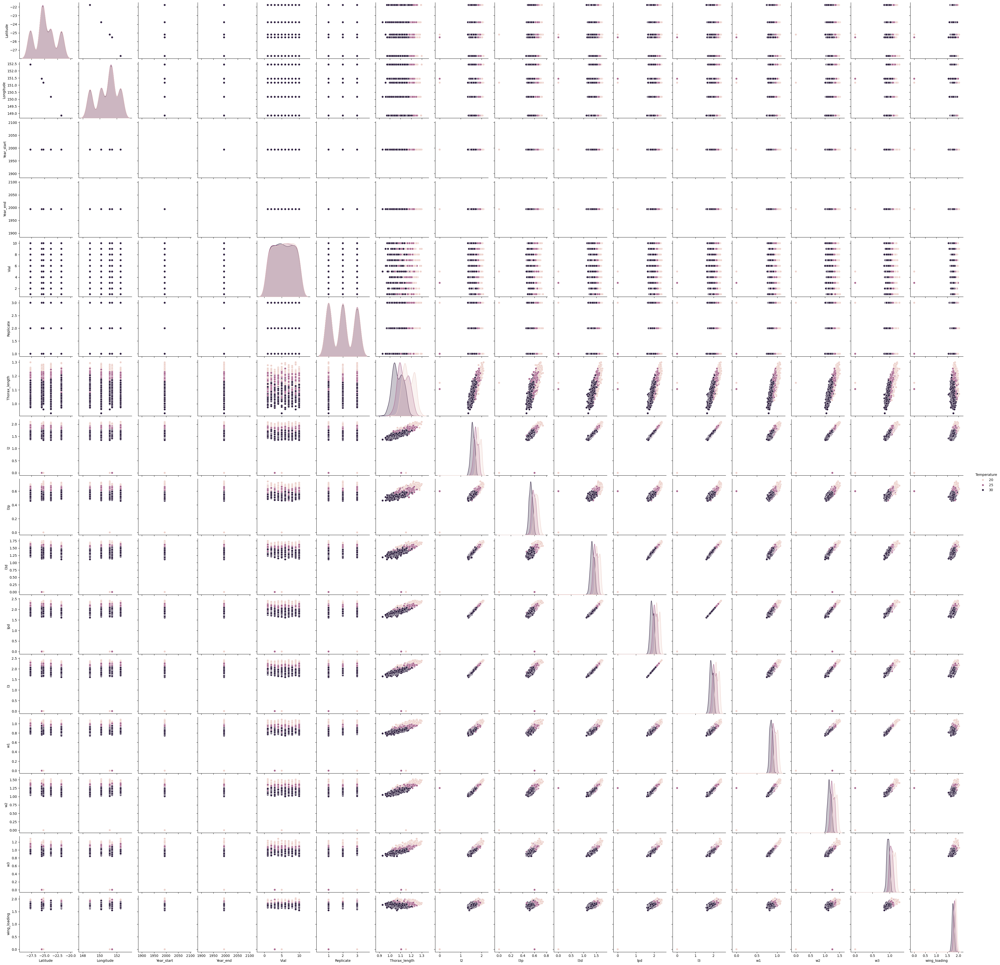

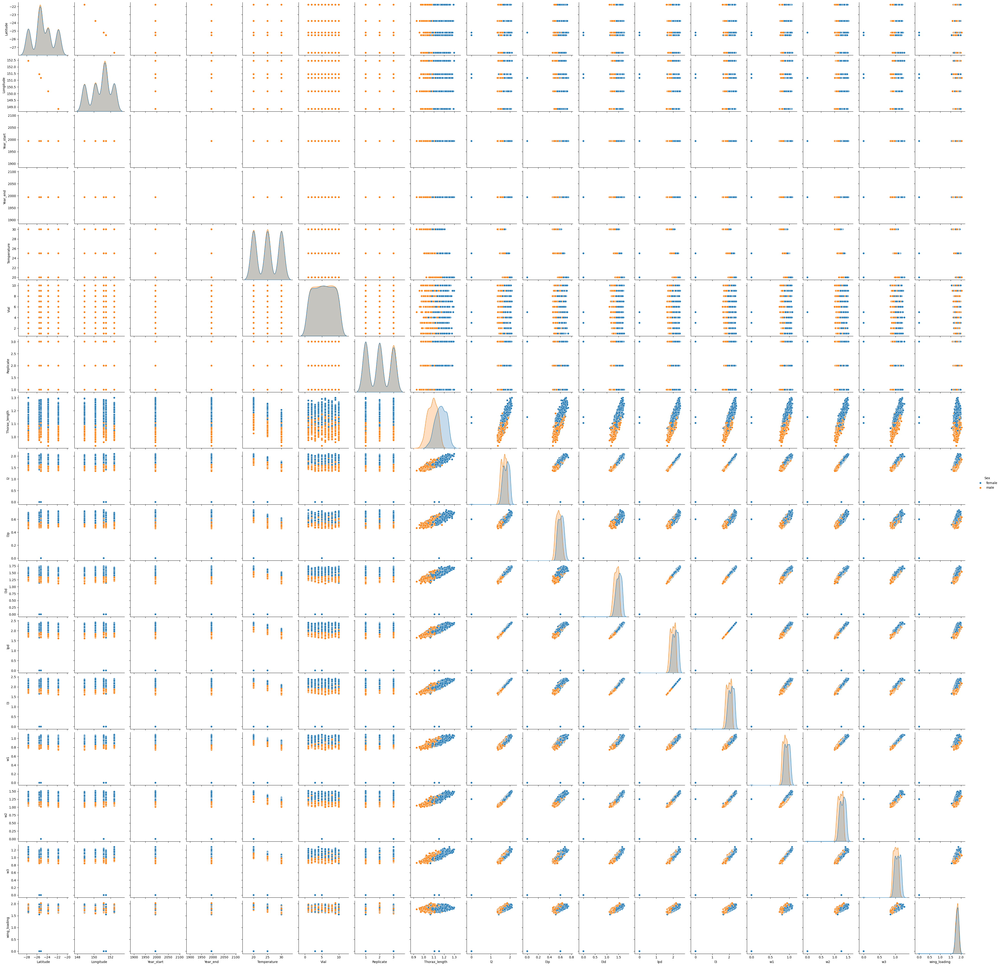

In [16]:
# Load the data into a pandas DataFrame
df = pd.read_csv("Data/83_Loeschcke_et_al_2000_Thorax_&_wing_traits_lab pops.csv")
# df = pd.read_csv("Data/84_Loeschcke_et_al_2000_Wing_traits_&_asymmetry_lab pops.csv")
# df = pd.read_csv("Data/85_Loeschcke_et_al_2000_Wing_asymmetry_lab_pops.csv")

# Print feature labels
print(df.columns.tolist())

# Plot the data against different features comparing the distribution of the 'Sex' feature
sns.pairplot(df, hue="Species")
sns.pairplot(df, hue="Population")
sns.pairplot(df, hue="Temperature")
sns.pairplot(df, hue="Sex")

### Choosing the Feature to Classify

Choosing the Label/Feature to classify is an important step. In this case 'Sex' was chosen as it has the most separable data across all the features (sex is split the best in most features).

In [17]:
# Define the label the model will classify
Label_name = 'Sex'

# Move the classifier column to the zeroth index
col = df.pop(Label_name)
df.insert(0, Label_name, col)

### Removing Unproductive Features

Columns with only one value give no information to out model so passing them to the model is wasteful

In [18]:
# Find columns of all the same value
all_same_value = df.nunique() == 1

# Print columns with all the same value
print("Columns with all the same value:")
print(all_same_value[all_same_value].index.tolist())

Columns with all the same value:
['Year_start', 'Year_end']


Reading the report for the data it can be found that 'Latitude' and 'Longitude' provide the same information as the 'Population' feature meaning if we keep the 'Population' feature it is wasteful to also add 'Latitude' and 'Longitude'.
Additionally, 'Vial' was assumed to represent the batch in which they were collected, and 'Replicate' as assumed to represent generation of the batch but it wasn't confirmed and thus it was found best to avoid using data that may or may not affect the generalization of the model on future data.

In [19]:
# List of columns to drop
columns_to_drop = ['Population','Latitude','Longitude','Vial', 'Replicate']
columns_to_drop.extend(all_same_value[all_same_value].index.tolist())

# Delete unnecessary columns
df.drop(columns=columns_to_drop, inplace=True)

# Print data labels
print(df.columns.tolist())

['Sex', 'Species', 'Temperature', 'Thorax_length', 'l2', 'l3p', 'l3d', 'lpd', 'l3', 'w1', 'w2', 'w3', 'wing_loading']


### Removing/Repairing Damaged Data-Points

In [20]:
from sklearn.preprocessing import LabelEncoder

Some rows are missing data entries, we have to decide if there is entries to be a valid point or if it isn't helpful enough and should just be deleted. therefore a threshold is assigned, if 70% of the data for the row is populated then it will be kept and less than 70% will be deleted from the data set to avoid bias data.

In [21]:
# Convert all entries of zero in column 4 and above to NaN
df.iloc[:, 4:] = df.iloc[:, 4:].replace(0, np.nan)

# Count non-null values per row
non_null_counts = df.notnull().sum(axis=1)

# Remove rows with more than 3 data entries missing
threshold = df.shape[1] - 3

# Filter rows based on the threshold
df = df[non_null_counts >= threshold]

Now there are still rows missing up to 30% of their data entries to fix this we can impute the missing entries by filling numerical columns with the mean value of the column, and filling categorical columns with the most frequent value in their column.

In [22]:

# Initialize SimpleImputers with appropriate strategies
fill_most_frequent = SimpleImputer(missing_values=np.nan, strategy="most_frequent")
fill_mean = SimpleImputer(missing_values=np.nan, strategy="mean")

Label_encoder_classifier = LabelEncoder()

# Iterate over columns in DataFrame
for column in df.columns:
    if isinstance(df[column][1], str):
        # For categorical columns, fill with most frequent value
        df[column] = pd.DataFrame(fill_most_frequent.fit_transform(df[[column]]))
        if df[column][1] == df[Label_name][1]:
            df[column] = pd.DataFrame(Label_encoder_classifier.fit_transform(df[column]))
        else:
            df[column] = pd.DataFrame(LabelEncoder().fit_transform(df[column]))
    else:
        # For numeric columns, fill with mean value
        df[column] = pd.DataFrame(fill_mean.fit_transform(df[[column]]))  # Fill missing values with mean



### Visualizing the Pre-Processed Dataset

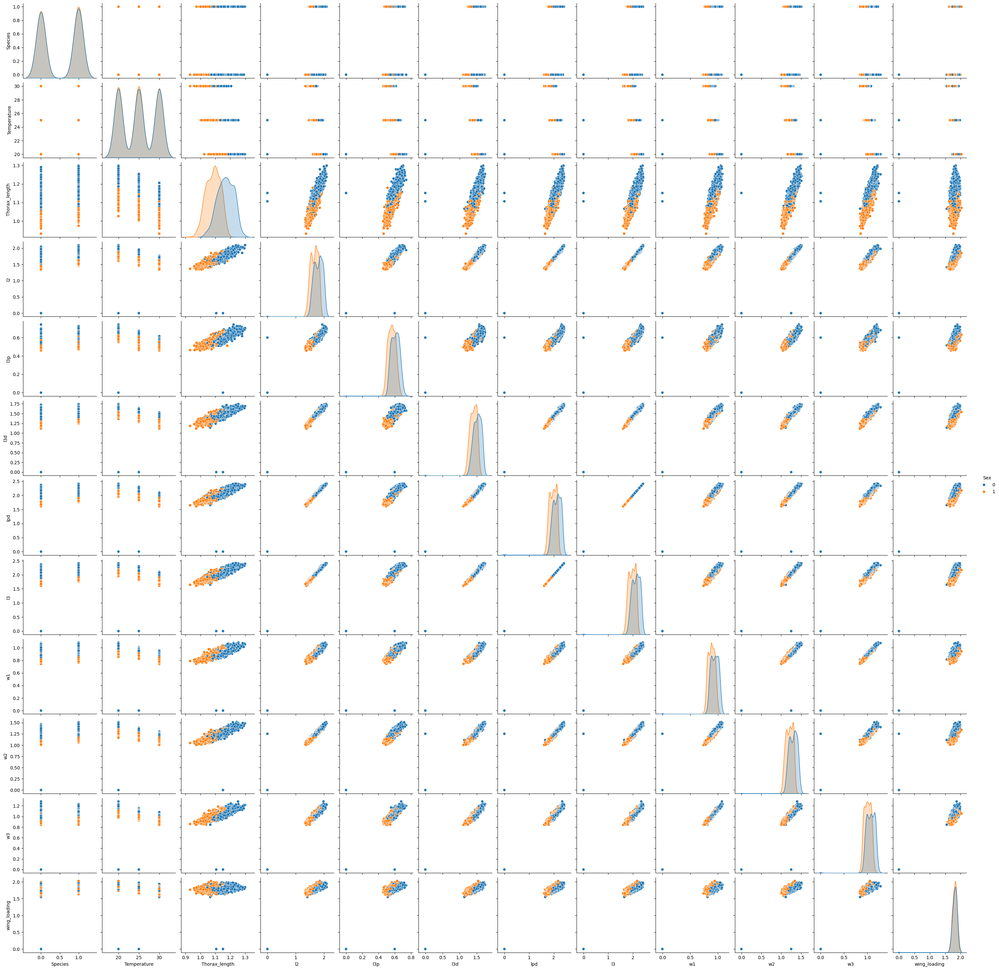

In [23]:
sns.pairplot(df, hue=Label_name)

In [24]:
# Save the processed data
df.to_csv("Data/83_modified.csv", index=False)

### Splitting the Dataset

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

When training a model it is important to split the dataset into training, validation, and test data. The training data is what is propagated through the model to update the model parameters. The validation data is passed through the model at the end of each epoch and gives a good estimate of the models generalization accuracy throughout training. Finally the test data is passed through the model after training to get the final un-bias model accuracy.
The rough standard for the train-validation-test dataset split is 60-80% training data, 10-20% validation data, and 10-20% test data.

In [26]:
# Assuming your dataframe df has the first column as the true labels (targets)
labels = df.iloc[:, 0].values  # Convert to numpy array
df = df.iloc[:, 1:].values   # Convert to numpy array

# Define ration of train, validation, and test data split
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# First, split into training and the rest
train_data, test_val_data, train_labels, test_val_labels = train_test_split(df, labels, test_size=1 - train_ratio, random_state=42)

# Second, split test_val_data into validation and test
val_data, test_data, val_labels, test_labels = train_test_split(test_val_data, test_val_labels, test_size=test_ratio/(test_ratio + val_ratio), random_state=42)

# Now you have train_data, val_data, and test_data ready
print(f"Training data size: {len(train_data)}")
print(f"Validation data size: {len(val_data)}")
print(f"Test data size: {len(test_data)}")

Training data size: 1211
Validation data size: 260
Test data size: 260


## Model Creation

In [27]:
import sys
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torch.optim.lr_scheduler import StepLR
from typing import List
print(torch.__version__)
print("Cuda Available : {0}".format(torch.cuda.is_available()))
if torch.cuda.is_available():
    print('GPU - {0}'.format(torch.cuda.get_device_name()))
print("Python version:", sys.version)

2.3.0+cu121
Cuda Available : False
Python version: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]


### MLP

In [28]:
# Define a simple MLP model constructor
class MLP(nn.Module):
    def __init__(self, dim_in: int, dim_out: int, hidden_layer_sizes: List[int]):
        super(MLP, self).__init__()
        
        print("Input Dimension: {0}".format(dim_in))
        print("Output Dimension: {0}".format(dim_out))
        print("Number of Hidden Layers: {0}".format(len(hidden_layer_sizes)))
        
        hiddens = [dim_in, *hidden_layer_sizes]
        layers = []
        
        # Create hidden layers with ReLU activation
        for i in range(len(hiddens) - 1):
            layers.append(nn.Linear(hiddens[i], hiddens[i + 1]))
            layers.append(nn.ReLU())
        
        # Add output layer
        if dim_out == 1:
            layers.append(nn.Linear(hiddens[-1], dim_out))
            layers.append(nn.Sigmoid())
        else:
            layers.append(nn.Linear(hiddens[-1], dim_out))
        
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

Tunning the hidden layers of an MLP are very important. There are two aspects of hidden layers, size of the layer, and number of layers, these can be mixed and matched to provide the optimal model for the dataset. 

Larger layers can capture more complex relationships within the data, but can lead to overfilling.

More layers can allow the model to learn more abstract features in higher dimensions improving generalization, but can lead to higher computational complexity.

In [29]:
hidden_layers = [512,512]

# Initialize model
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = MLP(df.shape[1], 1, hidden_layers).to(device)
print(model)

Input Dimension: 12
Output Dimension: 1
Number of Hidden Layers: 2
MLP(
  (model): Sequential(
    (0): Linear(in_features=12, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=1, bias=True)
    (5): Sigmoid()
  )
)


### Choosing Hyper Parameters

Choosing hyper parameters is one of the most important steps in developing a NN model. Tunning these values is the difference between having a model that gets 99% accuracy and a model that doesn't converge at all. The main hyper parameters to worry about include:
- #Epochs
- Batch Size
- Learning Rate
- Loss Function
- Optimiser (& optimiser specific hyper parameters)

In [30]:
num_epochs = 500
batch_size = 128
learning_rate = 0.001
momentum = 0.9
alpha = 0.9
weight_decay = 0.01
loss_function = torch.nn.BCELoss()
# optimiser = torch.optim.SGD(model.parameters(), lr=learning_rate, momentum=momentum)
# optimiser = torch.optim.Adagrad(model.parameters(), lr=learning_rate)
# optimiser = torch.optim.RMSprop(model.parameters(), lr=learning_rate, alpha=alpha)
optimiser = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

scheduler = StepLR(optimiser, step_size=10, gamma=0.1) # Decreases Learning rate over epochs to refine loss.

### Transforming the Data for Training

The datasets need to be converted to tensors for more efficient computation, then put into a DataLoader structure for batching and augmentation if necessary. This is the format in which pytorch passes data into a model.

In [31]:
# Convert to tensors
train_data = torch.tensor(train_data, dtype=torch.float32)
train_labels = torch.tensor(train_labels, dtype=torch.long)
val_data = torch.tensor(val_data, dtype=torch.float32)
val_labels = torch.tensor(val_labels, dtype=torch.long)
test_data = torch.tensor(test_data, dtype=torch.float32)
test_labels = torch.tensor(test_labels, dtype=torch.long)

# Create TensorDatasets
train_dataset = TensorDataset(train_data, train_labels)
val_dataset = TensorDataset(val_data, val_labels)
test_dataset = TensorDataset(test_data, test_labels)

# Define dataloaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

## Training

In [32]:
from tqdm import tqdm
import time

In [33]:
# Lists to store the loss and accuracy values
train_losses = []
train_accuracies = []
val_accuracies = []
val_losses = []

# Start the timer
start_time = time.time()

# Training loop
for epoch in range(num_epochs):
  
  model.train()
  correct = 0
  total = 0
  running_loss = 0
  # get the inputs from train data loader
  for batch_idx, (df, targets) in enumerate(tqdm(train_loader, desc = f"Epoch {epoch+1}")):
    
    # zero the parameter gradients
    optimiser.zero_grad()
    # forward pass through the model
    outputs = model(df.to(device)).squeeze()
    # backward propagation + optimize
    targets = targets.float().to(device)
    loss = loss_function(outputs, targets)
    loss.backward()
    optimiser.step()
    
    predicted = (outputs > 0.5).float().to(device)
    total += targets.size(0)
    correct += (predicted == targets.to(device)).sum().item()
    running_loss += loss.item()
  
  # Calculate training stats
  epoch_loss = running_loss / len(train_loader)
  epoch_accuracy = 100 * correct / total
  train_losses.append(epoch_loss)
  train_accuracies.append(epoch_accuracy)

  # Validate the model
  model.eval()
  correct = 0
  total = 0
  val_loss = 0
  with torch.no_grad():
    
    # get inputs from validation data loader
    for df,targets in val_loader:
      
      # forward pass + get predicted outputs
      outputs = model(df.to(device)).squeeze()
      targets = targets.float().to(device)
      
      # Calculate validation loss
      loss = loss_function(outputs, targets.to(device))
      val_loss += loss.item() * df.size(0)
      
      predicted = (outputs > 0.5).float().cpu()
      total += targets.size(0)
      correct += (predicted == targets.cpu()).sum().item()
      
  val_epoch_loss = val_loss / len(val_loader.dataset)
  val_losses.append(val_epoch_loss)
      
  # calculate accuracy of predictions
  val_accuracy = 100 * correct / total
  val_accuracies.append(val_accuracy)
  
  # Reduce learning rate if converged
  if val_epoch_loss < 0.1:
    scheduler.step()

# Calculate the training time
training_time = time.time() - start_time


Epoch 500: 100%|██████████| 10/10 [00:00<00:00, 206.22it/s]


In [34]:
import matplotlib.pyplot as plt

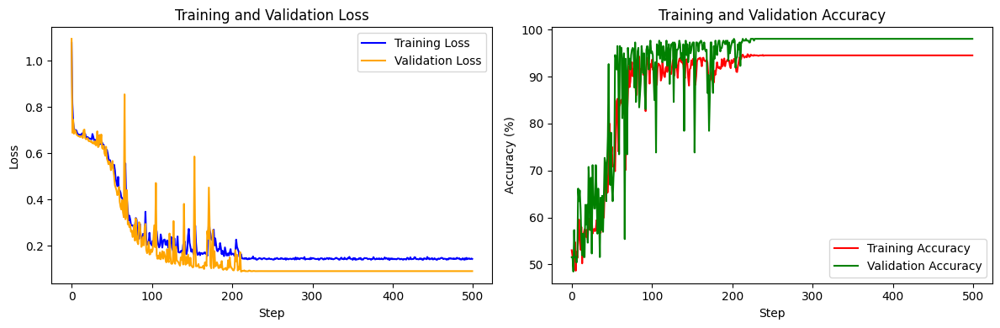

In [35]:
# Plot loss and accuracy

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss', color='b')
plt.plot(val_losses, label='Validation Loss', color='orange')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy', color='r')
plt.plot(val_accuracies, label='Validation Accuracy', color='g')
plt.xlabel('Step')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.tight_layout()
plt.show()

## Testing and Visualization

In [36]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

In [37]:
# Start the timer
start_time = time.time()
# After training, evaluate on the test set
model.eval()
correct = 0
total = 0
predictions = []
with torch.no_grad():
    # get inputs from test data loader
    for df,targets in test_loader:
        # forward pass + get predicted outputs
        outputs = model(df.to(device)).squeeze()
        predicted = (outputs > 0.5).float().cpu()
        predictions.extend(predicted)
        total += targets.size(0)
        correct += (predicted == targets.cpu()).sum().item()
        
# Convert the list of predictions to a numpy array
predictions = np.array(predictions)

# calculate accuracy of predictions
test_accuracy = 100 * correct / total

# Calculate the test time
test_time = time.time() - start_time

print(f'Final Test Accuracy: {test_accuracy:.2f}%')

Final Test Accuracy: 94.62%


### Confusion Matrix

[TP FN] \
[FP TN]

In [38]:
confusion_matrix = confusion_matrix(test_labels, predictions)
print("Confusion Matrix:")
print(confusion_matrix)

Confusion Matrix:
[[108   5]
 [  9 138]]


### Classification Report

Female: 0, Male: 1
- Precision: The proportion of true positive predictions among all positive predictions.
- Recall: The proportion of true positive predictions among all actual positive instances.
- F1-score: The harmonic mean of precision and recall, providing a balance between the two.
- Support: The number of actual occurrences of the class in the specified dataset.
- Accuracy: The overall accuracy of the model, which is the proportion of correct predictions among all predictions.
- Macro average: The unweighted mean of precision, recall, and F1-score across all classes. Each class contributes equally to this metric.
- Weighted average: The weighted mean of precision, recall, and F1-score across all classes, where each class's contribution is weighted by its support (the number of true instances).

In [39]:
# Calculate classification report
print("Classification Report:")
print(classification_report(test_labels, predictions))

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       113
           1       0.97      0.94      0.95       147

    accuracy                           0.95       260
   macro avg       0.94      0.95      0.95       260
weighted avg       0.95      0.95      0.95       260



### ROC & AUC

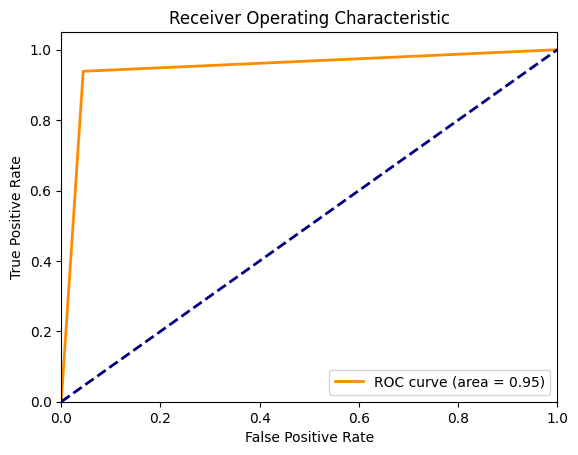

AUC: 0.95


In [40]:
# Compute ROC Curve and AUC
fpr, tpr, _ = roc_curve(test_labels, predictions)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

print(f'AUC: {roc_auc:.2f}')

### Saving the Results

In [41]:
# Load your CSV file into a pandas DataFrame
csv_file_path = 'Data/results.csv'
df = pd.read_csv(csv_file_path)

# Define your variables
var1 = test_accuracy
var2 = len(hidden_layers)
var3 = hidden_layers
var4 = num_epochs
var5 = batch_size
var6 = learning_rate
var7 = loss_function.__class__.__name__
var8 = optimiser.__class__.__name__
var9 = momentum
var10 = alpha
var11 = weight_decay
var12 = training_time
var13 = test_time

# Create a new row with the variables and image
new_row = [var1, var2, var3, var4, var5, var6, var7, var8, var9, var10, var11, var12, var13]

# Add the new row to the DataFrame
df.loc[len(df)] = new_row

# Save the updated DataFrame back to CSV
df.to_csv(csv_file_path, index=False)

print("Row added successfully!")

Row added successfully!


## Utilizing the Model

After training and evaluation, use the model 

In [42]:
# Specify the values for a fruit fly and get the estimated 'Sex'.
data = np.array([[0,        # Species
                  20,       # Temperature
                  1.145,    # Thorax_length
                  1.782,    # l2
                  0.605,    # l3p
                  1.490,    # l3d
                  2.096,    # lpd
                  2.095,    # l3
                  0.934,    # w1
                  1.300,    # w2
                  1.055,    # w3
                  1.83]])   # wing_loading

In [43]:
# Convert the DataFrame to a PyTorch tensor
test_tensor = torch.tensor(data, dtype=torch.float32)

model.eval()
with torch.no_grad():
    # forward pass
    output = model(test_tensor.to(device)).squeeze()
    predicted = (output > 0.5).float().cpu()

# Convert predicted 0 or 1 back to Female or Male
decoded_class = Label_encoder_classifier.inverse_transform(np.array([int(predicted.item())]))

# Calculate certainty 
if decoded_class.item() == 'female':
    certainty = (1 - output.item()) * 100
else:
    certainty = output.item() * 100

# Print the results
print(f"Your Drosophila's (Fruit Fly's) sex is: %s, with certainty: %.2f%%" % (decoded_class.item(), certainty))

Your Drosophila's (Fruit Fly's) sex is: male, with certainty: 95.33%
